In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import seaborn as sns
import holidays
import optuna
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, TimeSeriesSplit, GridSearchCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
import lightgbm as lgb
from sklearn.model_selection import KFold
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm

df = pd.read_csv("train.csv")
df["date"] = pd.to_datetime(df["date"])

In [2]:
df.head()

,id,date,country,store,product,num_sold
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0


In [3]:
print(df.dtypes)
print(df.shape)

id            int64
date         object
country      object
store        object
product      object
num_sold    float64
dtype: object
(230130, 6)


In [4]:
print(df.isnull().sum()/len(df) * 100)
print(df.duplicated().sum())

id          0.000000
date        0.000000
country     0.000000
store       0.000000
product     0.000000
num_sold    3.854778
dtype: float64
0


In [7]:
for i in df.columns:
    if (i == "id") or (i == "num_sold"):
        continue
    print(i + " Unique Values: " + str(df[i].nunique()))

date Unique Values: 2557
country Unique Values: 6
store Unique Values: 3
product Unique Values: 5


In [12]:
for i in df.columns:
    if i == "id" or i == "num_sold":
        continue
    print(df[i].value_counts())
    print("")

date
2010-01-01    90
2014-09-05    90
2014-08-29    90
2014-08-30    90
2014-08-31    90
              ..
2012-05-03    90
2012-05-04    90
2012-05-05    90
2012-05-06    90
2016-12-31    90
Name: count, Length: 2557, dtype: int64

country
Canada       38355
Finland      38355
Italy        38355
Kenya        38355
Norway       38355
Singapore    38355
Name: count, dtype: int64

store
Discount Stickers       76710
Stickers for Less       76710
Premium Sticker Mart    76710
Name: count, dtype: int64

product
Holographic Goose     46026
Kaggle                46026
Kaggle Tiers          46026
Kerneler              46026
Kerneler Dark Mode    46026
Name: count, dtype: int64



In [26]:
for i in dfTest.columns:
    if i == "id" or i == "num_sold":
        continue
    print(dfTest[i].value_counts())
    print("")

date
2017-01-01    90
2018-12-30    90
2019-01-05    90
2019-01-04    90
2019-01-03    90
              ..
2018-01-07    90
2018-01-08    90
2018-01-09    90
2018-01-10    90
2019-12-31    90
Name: count, Length: 1095, dtype: int64

country
Canada       16425
Finland      16425
Italy        16425
Kenya        16425
Norway       16425
Singapore    16425
Name: count, dtype: int64

store
Discount Stickers       32850
Stickers for Less       32850
Premium Sticker Mart    32850
Name: count, dtype: int64

product
Holographic Goose     19710
Kaggle                19710
Kaggle Tiers          19710
Kerneler              19710
Kerneler Dark Mode    19710
Name: count, dtype: int64

year
2017    32850
2018    32850
2019    32850
Name: count, dtype: int64

month
1     8370
3     8370
5     8370
7     8370
8     8370
10    8370
12    8370
4     8100
6     8100
9     8100
11    8100
2     7560
Name: count, dtype: int64

day
1     3240
2     3240
28    3240
27    3240
26    3240
25    3240
24    3240


In [7]:
""" Credited to this https://www.kaggle.com/code/cabaxiom/s5e1-eda-and-linear-regression-baseline?scriptVersionId=216127469
I thought about creating this myself but there isn't really any poitn to that if this is shared, from future onwards
using ratios of relavant data as a means of imputing is viable and the best-performing datasets do this and either use lienar regression or fine-tune using optuna"""
gdp_per_capita_df = pd.read_csv("gdp.csv")

years =  ["2010", "2011", "2012", "2013", "2014", "2015", "2016", "2017", "2018", "2019", "2020"]
gdp_per_capita_filtered_df = gdp_per_capita_df.loc[gdp_per_capita_df["Country Name"].isin(df["country"].unique()), ["Country Name"] + years].set_index("Country Name")
gdp_to_merge = gdp_per_capita_filtered_df
gdp_per_capita_filtered_df["2010_ratio"] = gdp_per_capita_filtered_df["2010"] / gdp_per_capita_filtered_df.sum()["2010"]
for year in years:
    gdp_per_capita_filtered_df[f"{year}_ratio"] = gdp_per_capita_filtered_df[year] / gdp_per_capita_filtered_df.sum()[year]
gdp_per_capita_filtered_ratios_df = gdp_per_capita_filtered_df[[i+"_ratio" for i in years]]
gdp_per_capita_filtered_ratios_df.columns = [int(i) for i in years]
gdp_per_capita_filtered_ratios_df = gdp_per_capita_filtered_ratios_df.unstack().reset_index().rename(columns = {"level_0": "year", 0: "ratio", "Country Name": "country"})
gdp_per_capita_filtered_ratios_df['year'] = pd.to_datetime(gdp_per_capita_filtered_ratios_df['year'], format='%Y')
gdp_per_capita_filtered_df

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,...,2011_ratio,2012_ratio,2013_ratio,2014_ratio,2015_ratio,2016_ratio,2017_ratio,2018_ratio,2019_ratio,2020_ratio
Country Name,,,,,,,,,,,,,,,,,,,,,
Canada,47560.666600,52223.858840,52670.344730,52638.118720,50960.843120,43594.194100,42314.061580,45129.628120,46539.176160,46352.869340,...,0.175045,0.178867,0.175479,0.173632,0.175439,0.171860,0.171772,0.164793,0.169793,0.169942
Finland,46506.291900,51060.324260,47551.674080,49691.014520,50073.776080,42560.345680,43451.256240,46085.017470,49654.249700,48358.180780,...,0.171145,0.161484,0.165654,0.170609,0.171278,0.176478,0.175408,0.175823,0.177138,0.190594
Italy,36184.711870,38851.388130,35235.798910,35747.707950,35750.719750,30387.129320,31126.324690,32554.146680,34746.344140,33812.788720,...,0.130223,0.119660,0.119171,0.121808,0.122289,0.126420,0.123907,0.123035,0.123858,0.125263
Kenya,1091.518731,1096.144998,1285.005362,1370.878852,1482.815663,1489.119598,1554.126103,1667.484472,1836.452755,1960.408089,...,0.003674,0.004364,0.004570,0.005052,0.005993,0.006312,0.006347,0.006503,0.007181,0.007524
Norway,88163.208590,101221.813500,102175.919300,103553.840100,97666.695180,74809.965800,70867.361000,76131.838400,82792.842710,76430.588950,...,0.339278,0.346987,0.345215,0.332766,0.301063,0.287829,0.289772,0.293166,0.279969,0.266753
Singapore,47236.683080,53891.457030,55547.555310,56967.425790,57564.802310,55645.606860,56899.918180,61162.097390,66840.637340,66081.719920,...,0.180635,0.188638,0.189911,0.196132,0.223938,0.231100,0.232794,0.236680,0.242061,0.239924


In [8]:
""" credit https://www.kaggle.com/code/cabaxiom/s5e1-eda-and-linear-regression-baseline?scriptVersionId=216127469 """
gdp_per_capita_filtered_ratios_df["year"] = gdp_per_capita_filtered_ratios_df["year"].dt.year
df_imputed = df.copy()
print(f"Missing values remaining: {df_imputed['num_sold'].isna().sum()}")

df_imputed["year"] = df_imputed["date"].dt.year
for year in df_imputed["year"].unique():
    # Impute Time Series 1 (Canada, Discount Stickers, Holographic Goose)
    target_ratio = gdp_per_capita_filtered_ratios_df.loc[(gdp_per_capita_filtered_ratios_df["year"] == year) & (gdp_per_capita_filtered_ratios_df["country"] == "Norway"), "ratio"].values[0] # Using Norway as should have the best precision
    current_raito = gdp_per_capita_filtered_ratios_df.loc[(gdp_per_capita_filtered_ratios_df["year"] == year) & (gdp_per_capita_filtered_ratios_df["country"] == "Canada"), "ratio"].values[0]
    ratio_can = current_raito / target_ratio
    df_imputed.loc[(df_imputed["country"] == "Canada") & (df_imputed["store"] == "Discount Stickers") & 
    (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year), "num_sold"] = (df_imputed.loc[(df_imputed["country"] == "Norway") & (df_imputed["store"] == "Discount Stickers") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year), "num_sold"] * ratio_can).values
    
    # Impute Time Series 2 (Only Missing Values)
    current_ts =  df_imputed.loc[(df_imputed["country"] == "Canada") & (df_imputed["store"] == "Premium Sticker Mart") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    df_imputed.loc[(df_imputed["country"] == "Canada") & (df_imputed["store"] == "Premium Sticker Mart") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year) & (df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (df_imputed.loc[(df_imputed["country"] == "Norway") & (df_imputed["store"] == "Premium Sticker Mart") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year) & (df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_can).values

    # Impute Time Series 3 (Only Missing Values)
    current_ts =  df_imputed.loc[(df_imputed["country"] == "Canada") & (df_imputed["store"] == "Stickers for Less") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    df_imputed.loc[(df_imputed["country"] == "Canada") & (df_imputed["store"] == "Stickers for Less") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year) & (df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (df_imputed.loc[(df_imputed["country"] == "Norway") & (df_imputed["store"] == "Stickers for Less") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year) & (df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_can).values
    
    # Impute Time Series 4 (Kenya, Discount Stickers, Holographic Goose)
    current_raito = gdp_per_capita_filtered_ratios_df.loc[(gdp_per_capita_filtered_ratios_df["year"] == year) & (gdp_per_capita_filtered_ratios_df["country"] == "Kenya"), "ratio"].values[0]
    ratio_ken = current_raito / target_ratio
    df_imputed.loc[(df_imputed["country"] == "Kenya") & (df_imputed["store"] == "Discount Stickers") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year), "num_sold"] = (df_imputed.loc[(df_imputed["country"] == "Norway") & (df_imputed["store"] == "Discount Stickers") & (df_imputed["product"] == "Holographic Goose")& (df_imputed["year"] == year), "num_sold"] * ratio_ken).values

    # Impute Time Series 5 (Only Missing Values)
    current_ts = df_imputed.loc[(df_imputed["country"] == "Kenya") & (df_imputed["store"] == "Premium Sticker Mart") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    df_imputed.loc[(df_imputed["country"] == "Kenya") & (df_imputed["store"] == "Premium Sticker Mart") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year) & (df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (df_imputed.loc[(df_imputed["country"] == "Norway") & (df_imputed["store"] == "Premium Sticker Mart") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year) & (df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_ken).values

    # Impute Time Series 6 (Only Missing Values)
    current_ts = df_imputed.loc[(df_imputed["country"] == "Kenya") & (df_imputed["store"] == "Stickers for Less") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    df_imputed.loc[(df_imputed["country"] == "Kenya") & (df_imputed["store"] == "Stickers for Less") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year) & (df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (df_imputed.loc[(df_imputed["country"] == "Norway") & (df_imputed["store"] == "Stickers for Less") & (df_imputed["product"] == "Holographic Goose") & (df_imputed["year"] == year) & (df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_ken).values

    # Impute Time Series 7 (Only Missing Values)
    current_ts = df_imputed.loc[(df_imputed["country"] == "Kenya") & (df_imputed["store"] == "Discount Stickers") & (df_imputed["product"] == "Kerneler") & (df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    df_imputed.loc[(df_imputed["country"] == "Kenya") & (df_imputed["store"] == "Discount Stickers") & (df_imputed["product"] == "Kerneler") & (df_imputed["year"] == year) & (df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (df_imputed.loc[(df_imputed["country"] == "Norway") & (df_imputed["store"] == "Discount Stickers") & (df_imputed["product"] == "Kerneler") & (df_imputed["year"] == year) & (df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_ken).values
    
print(f"Missing values remaining: {df_imputed['num_sold'].isna().sum()}")

Missing values remaining: 8871
Missing values remaining: 2


In [9]:
""" Credit to https://www.kaggle.com/code/cabaxiom/s5e1-eda-and-linear-regression-baseline?scriptVersionId=216127469 """
missing_rows = df_imputed.loc[df_imputed["num_sold"].isna()]

df_imputed.loc[df_imputed["id"] == 23719, "num_sold"] = 4
df_imputed.loc[df_imputed["id"] == 207003, "num_sold"] = 195

print(f"Missing values remaining: {df_imputed['num_sold'].isna().sum()}")
df = df_imputed

Missing values remaining: 0


In [9]:
gdp_to_merge = gdp_to_merge[["2010", "2011", "2012", "2013", "2014", "2015", "2016", "2017", "2018", "2019", "2020"]].reset_index().melt(id_vars=['Country Name'], var_name='year', value_name="gdp")
gdp_to_merge = gdp_to_merge.rename(columns={"Country Name": "country"})
df["year"] = df["date"].dt.year
gdp_to_merge["country"] = gdp_to_merge["country"].astype("category")
gdp_to_merge["year"] = gdp_to_merge["year"].astype("int32")
df = pd.merge(df, gdp_to_merge, on=['country', 'year'], how='inner')
df.head()

,id,date,country,store,product,num_sold,year,gdp
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,140.799481,2010,47560.6666
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.000000,2010,47560.6666
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.000000,2010,47560.6666
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.000000,2010,47560.6666
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.000000,2010,47560.6666


In [43]:
def adf_test(series):
    """Using an ADF test to determine if a series is stationary"""
    test_results = adfuller(series)
    print('ADF Statistic: ', test_results[0])
    print('P-Value: ', test_results[1])
    print('Critical Values:')
    for thres, adf_stat in test_results[4].items():
        print('\t%s: %.2f' % (thres, adf_stat))


adf_test(df["num_sold"].loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kaggle")].diff()[1:])

ADF Statistic:  -1.7664245740306028
P-Value:  0.39725370106441155
Critical Values:
	1%: -3.43
	5%: -2.86
	10%: -2.57


In [28]:
df["country"].unique()

array(['Canada', 'Finland', 'Italy', 'Kenya', 'Norway', 'Singapore'],
      dtype=object)

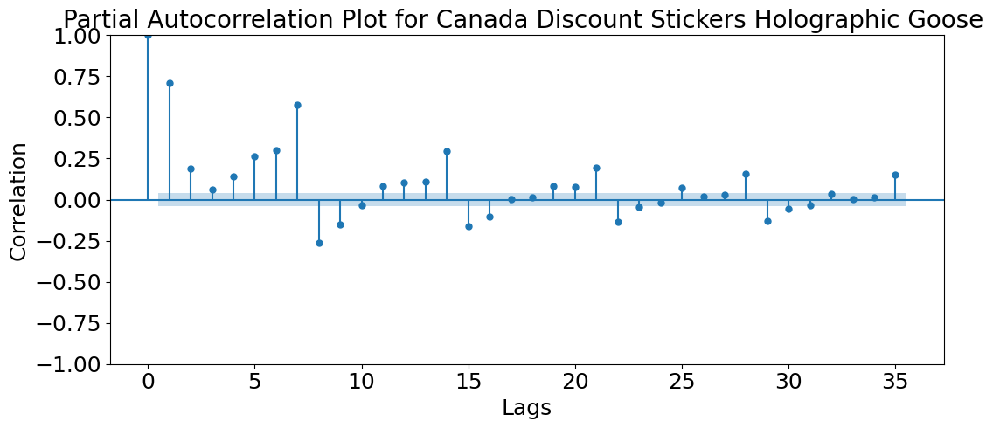

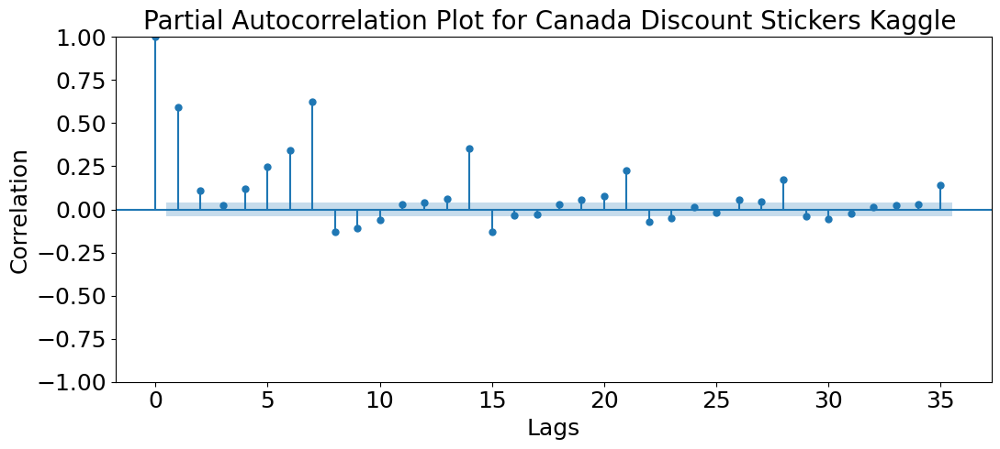

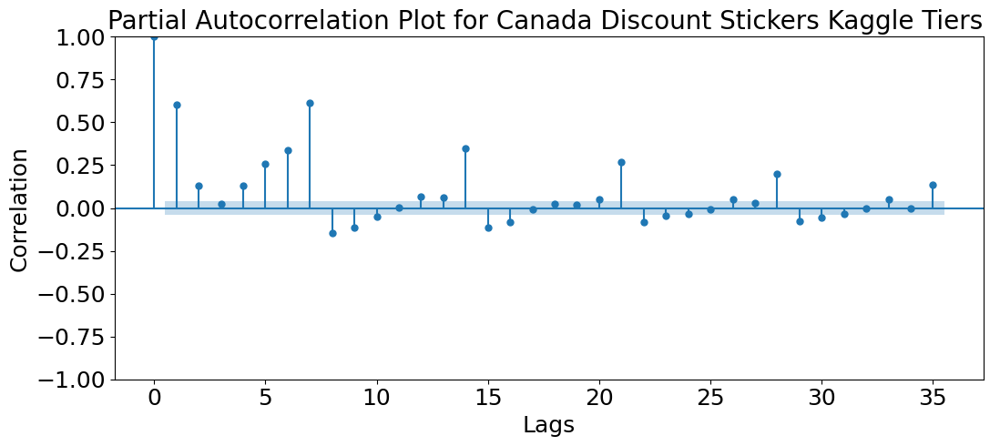

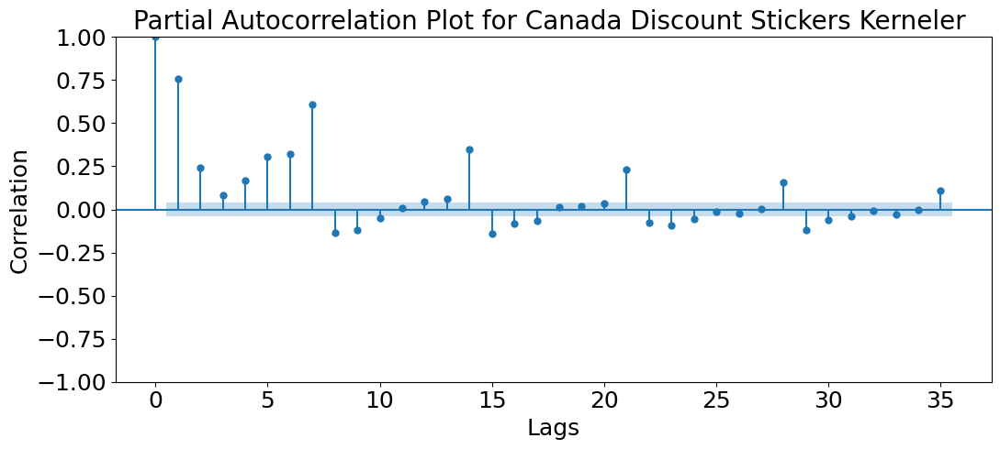

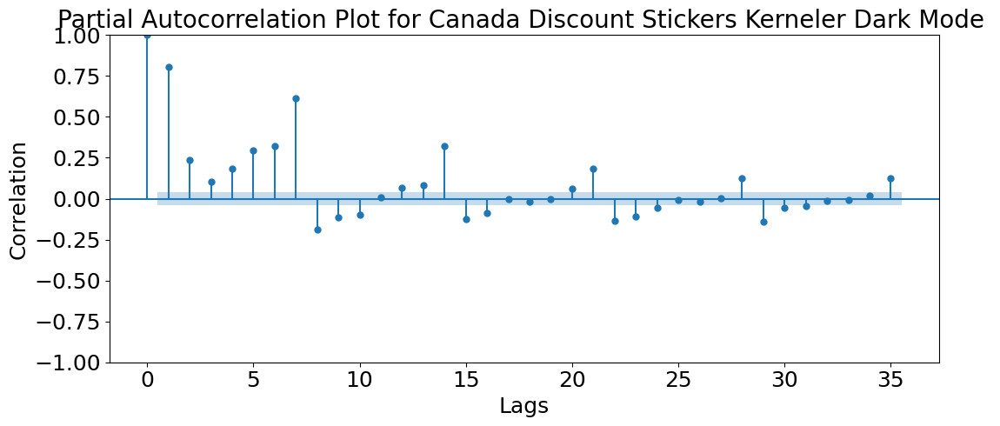

...

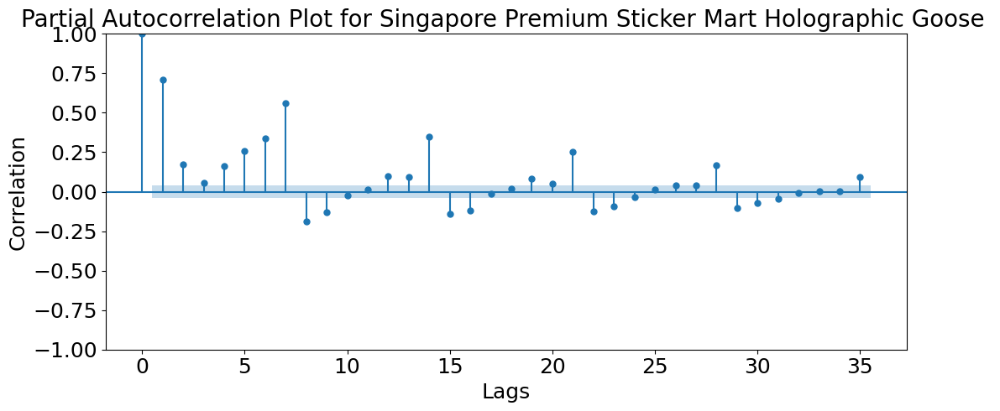

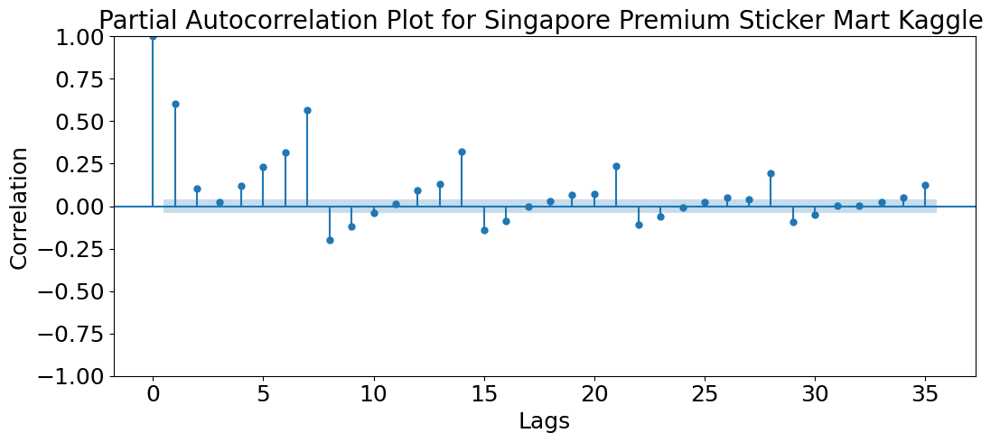

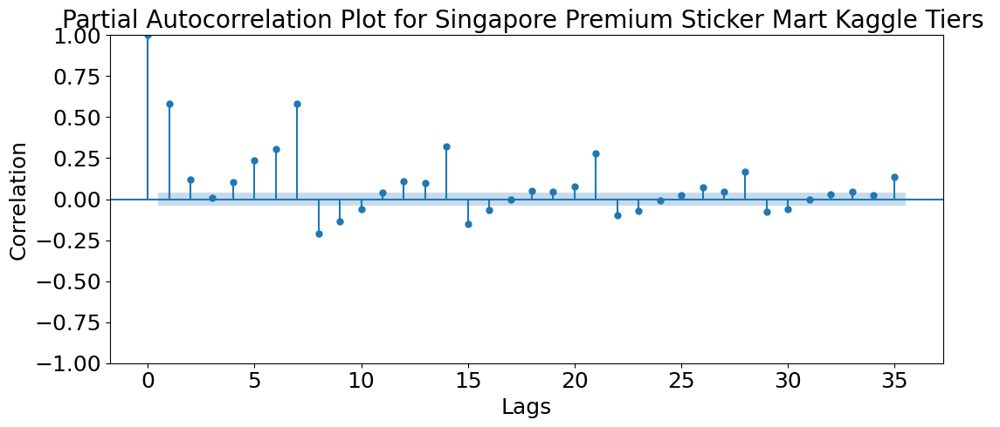

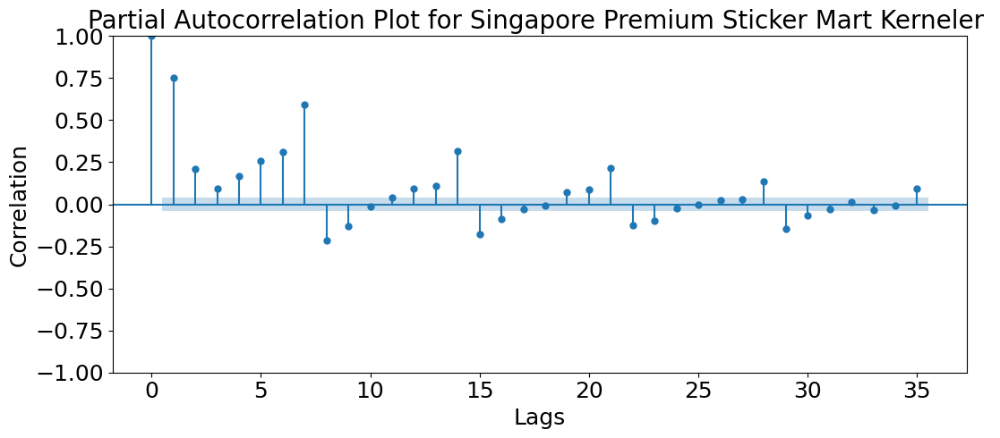

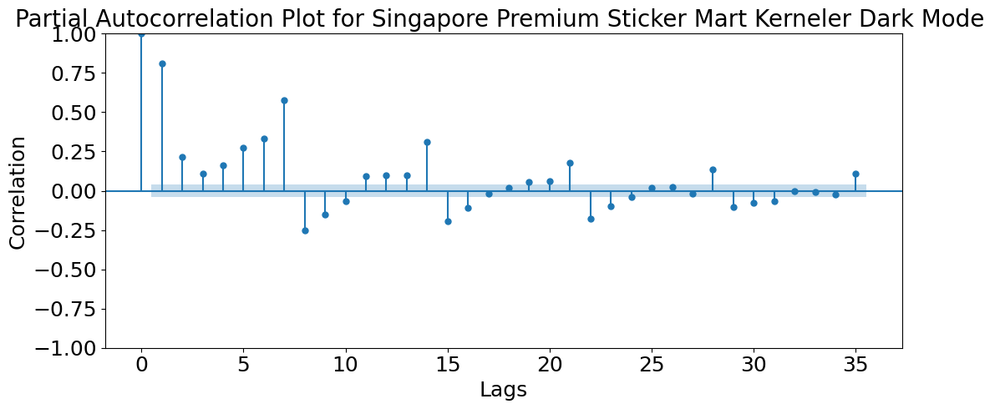

In [30]:
for i in df["country"].unique():
    for j in df["store"].unique():
        for k in df["product"].unique():
            
            plt.rc("figure", figsize=(11,5))
            plot_pacf(np.log1p(df.loc[(df["country"] == i) & (df["store"] == j) & (df["product"] == k)]['num_sold']), method='ywm')
            plt.xlabel('Lags', fontsize=18)
            plt.ylabel('Correlation', fontsize=18)
            plt.xticks(fontsize=18)
            plt.yticks(fontsize=18)
            plt.title('Partial Autocorrelation Plot for ' + i + " " + j + " " + k + " ", fontsize=20)
            plt.tight_layout()
            plt.show()

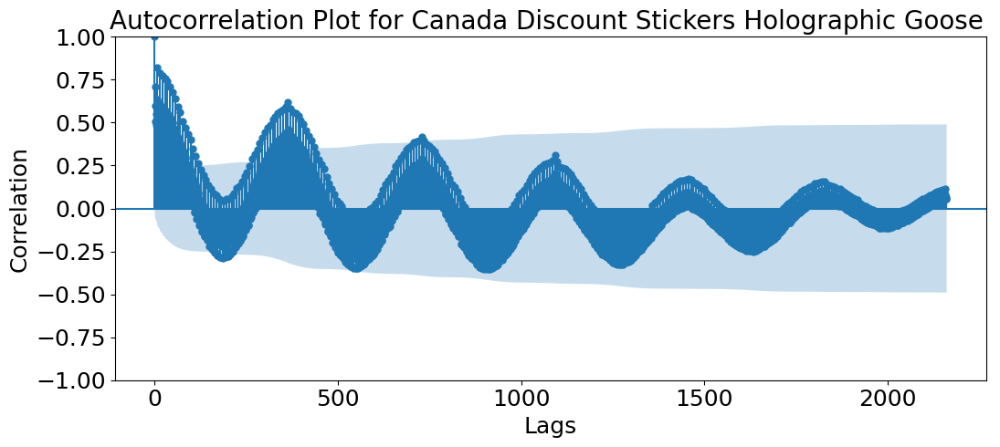

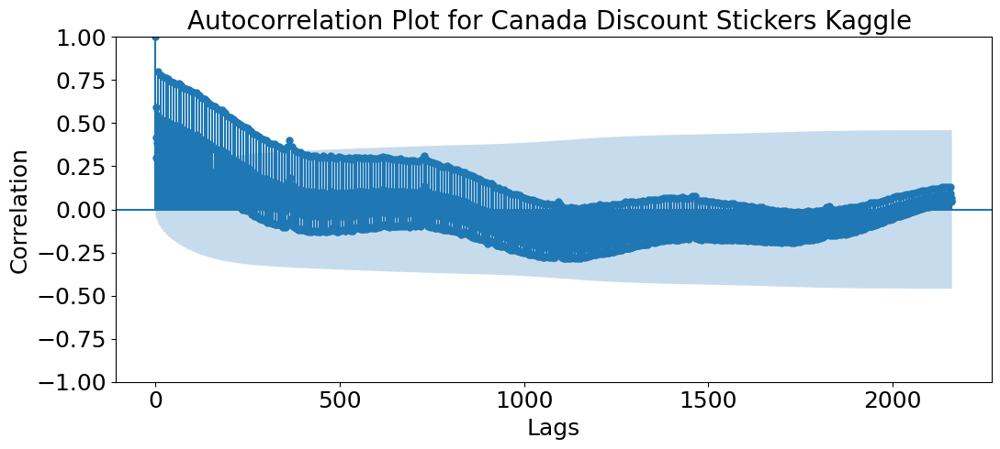

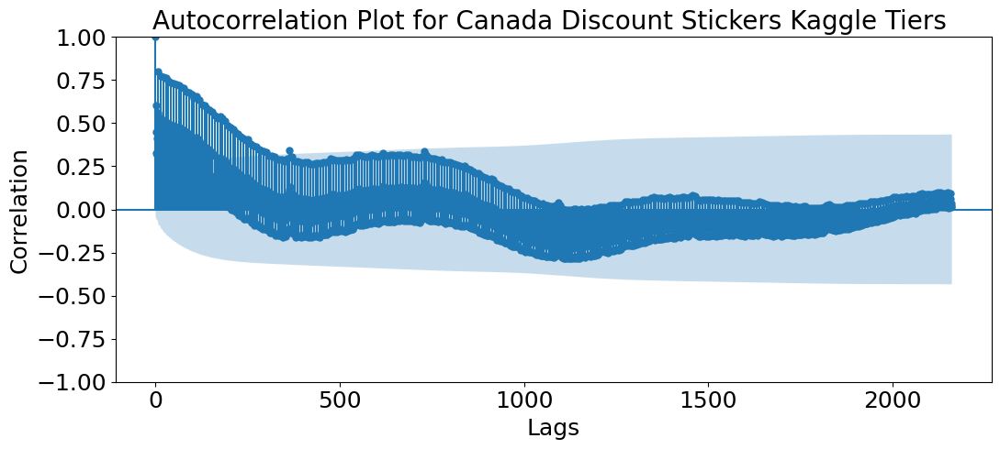

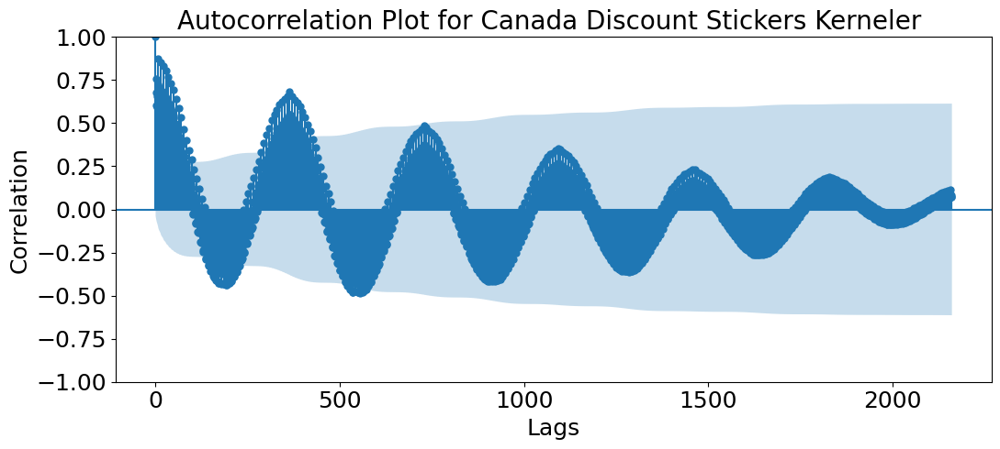

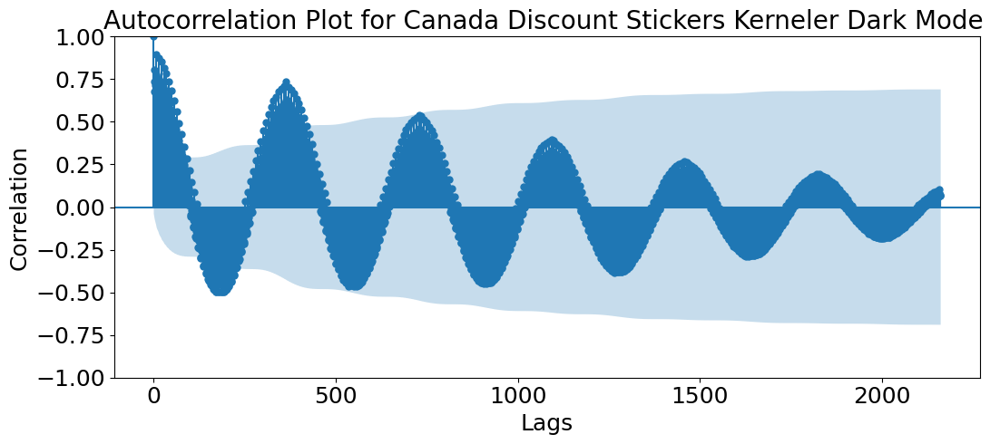

...

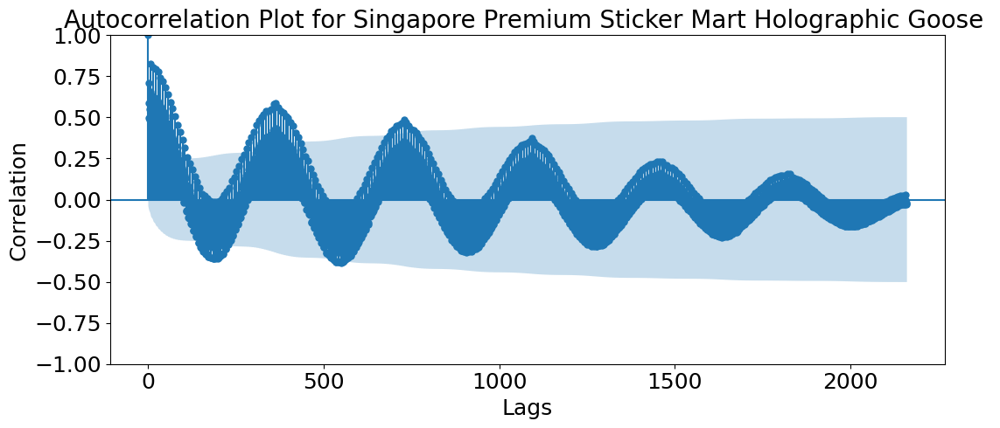

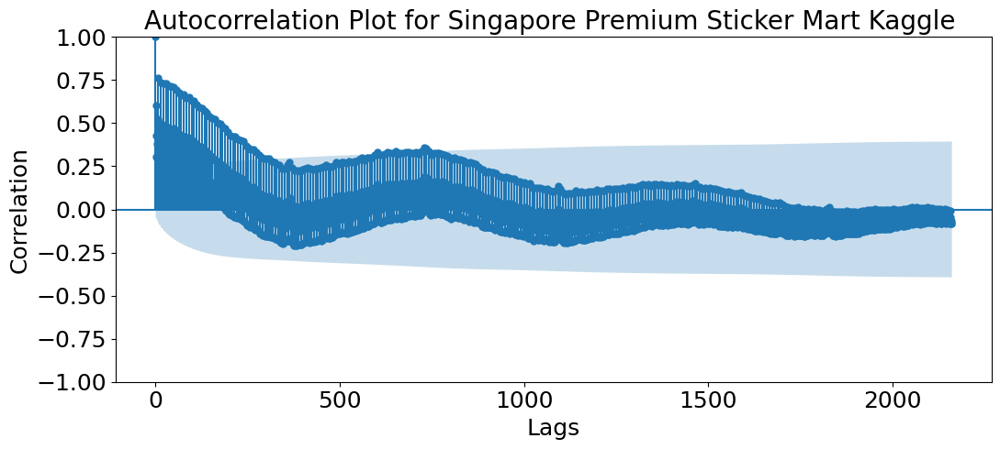

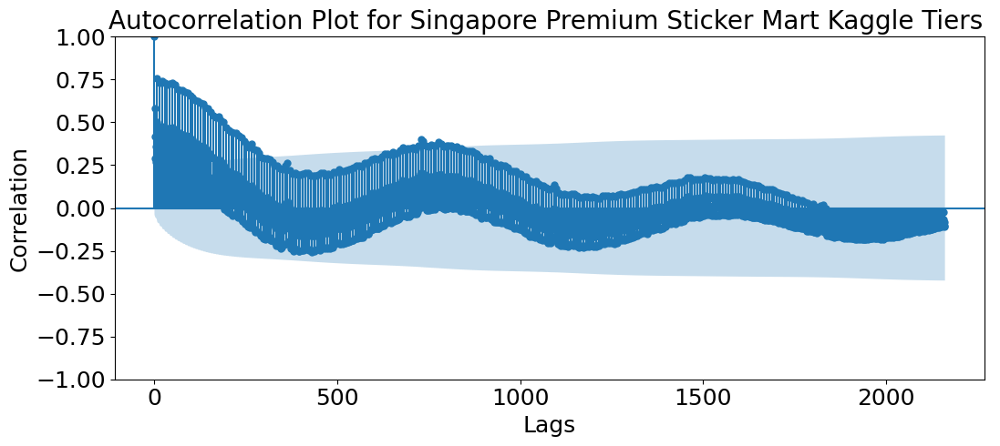

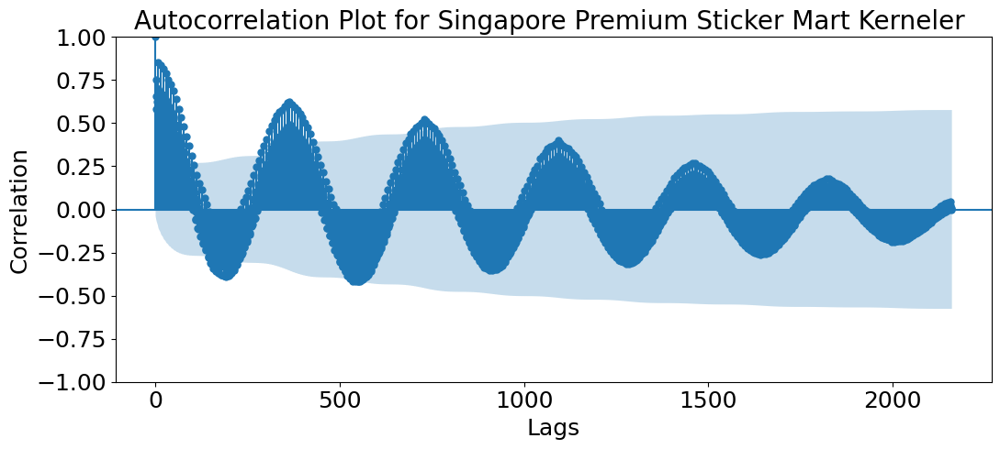

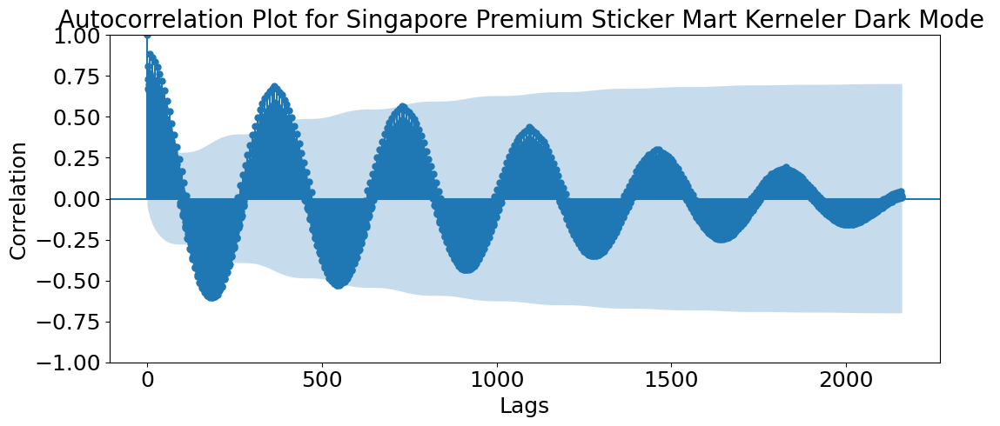

In [25]:
for i in df["country"].unique():
    for j in df["store"].unique():
        for k in df["product"].unique():
            
            plt.rc("figure", figsize=(11,5))
            plot_acf(np.log1p(df.loc[(df["country"] == i) & (df["store"] == j) & (df["product"] == k)]['num_sold']), lags=2160)
            plt.xlabel('Lags', fontsize=18)
            plt.ylabel('Correlation', fontsize=18)
            plt.xticks(fontsize=18)
            plt.yticks(fontsize=18)
            plt.title('Autocorrelation Plot for ' + i + " " + j + " " + k + " ", fontsize=20)
            plt.tight_layout()
            plt.show()




In [14]:
import math
#+ (df["year"] % 4 == 0).astype(int))
df["day_of_year"] = df["date"].dt.dayofyear
df["year"] = df["date"].dt.year
df["day_of_biyear"] = (df["year"] % 2) * 365 + df["day_of_year"]
for i in range(1, 10):
    df[f"biyear_fourier_sin_order_{i}"] = np.sin(2*np.pi*i*df['day_of_biyear']/730)
    df[f"biyear_fourier_cos_order_{i}"] = np.cos(2*np.pi*i*df['day_of_biyear']/730) 
    df[f"year_fourier_sin_order_{i}"] = np.sin(2 * np.pi * i * df["day_of_year"] /365)
    df[f"year_fourier_cos_order_{i}"] = np.cos(2*np.pi*i*df["day_of_year"]/365)
fourier_features_biyear = [i for i in list(df) if i.startswith('biyear')]
fourier_features_year = [i for i in list(df) if i.startswith('year')]
print(df[fourier_features_biyear].tail())
print(df[fourier_features_year].tail())

        biyear_fourier_sin_order_1  biyear_fourier_cos_order_1  \
230125                   -0.008607                   -0.999963   
230126                   -0.008607                   -0.999963   
230127                   -0.008607                   -0.999963   
230128                   -0.008607                   -0.999963   
230129                   -0.008607                   -0.999963   

        biyear_fourier_sin_order_2  biyear_fourier_cos_order_2  \
230125                    0.017213                    0.999852   
230126                    0.017213                    0.999852   
230127                    0.017213                    0.999852   
230128                    0.017213                    0.999852   
230129                    0.017213                    0.999852   

        biyear_fourier_sin_order_3  biyear_fourier_cos_order_3  \
230125                   -0.025818                   -0.999667   
230126                   -0.025818                   -0.999667   
230127  

In [62]:
from pmdarima import auto_arima
"""
# Fit auto_arima to find the best ARIMA model
model = auto_arima(np.log1p(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kaggle")]['num_sold']),
                   X = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kaggle")][fourier_features_biyear],
                   maxiter = 200,
                   start_p=1, start_q=1,      # Initial guesses for p and q
                   max_p=7, max_q=7,          # Upper bounds for p and q
                   m=7,                      # Seasonal period (e.g., 12 for monthly data)
                   start_P=0, start_Q = 0,
                   seasonal=True,  # For seasonal ARIMA
                   d=None,                    # Automatically determine order of differencing
                   D=None,                    # Automatically determine seasonal differencing
                   max_order = None,
                   trace=True,                # Print model selection progress
                   error_action='ignore',     # Ignore errors and continue
                   suppress_warnings=True,    # Suppress warnings
                   stepwise=True)             # Use stepwise search to reduce computation

# Print the summary of the best model
print(model.summary())"""

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[7] intercept   : AIC=-4595.955, Time=9.06 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=-3637.701, Time=1.05 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=-5416.147, Time=37.73 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=-4984.085, Time=22.46 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=-3639.699, Time=2.01 sec
 ARIMA(1,1,0)(0,0,0)[7] intercept   : AIC=-3871.028, Time=0.74 sec
 ARIMA(1,1,0)(2,0,0)[7] intercept   : AIC=-5844.986, Time=25.00 sec
 ARIMA(1,1,0)(2,0,1)[7] intercept   : AIC=inf, Time=66.78 sec
 ARIMA(1,1,0)(1,0,1)[7] intercept   : AIC=inf, Time=20.44 sec
 ARIMA(0,1,0)(2,0,0)[7] intercept   : AIC=-5398.881, Time=28.16 sec
 ARIMA(2,1,0)(2,0,0)[7] intercept   : AIC=-5967.402, Time=128.81 sec
 ARIMA(2,1,0)(1,0,0)[7] intercept   : AIC=-5528.689, Time=21.33 sec
 ARIMA(2,1,0)(2,0,1)[7] intercept   : AIC=inf, Time=135.86 sec
 ARIMA(2,1,0)(1,0,1)[7] intercept   : AIC=inf, Time=38.97 sec
 ARIMA(3,1,0)(2,0,0)[7] interce

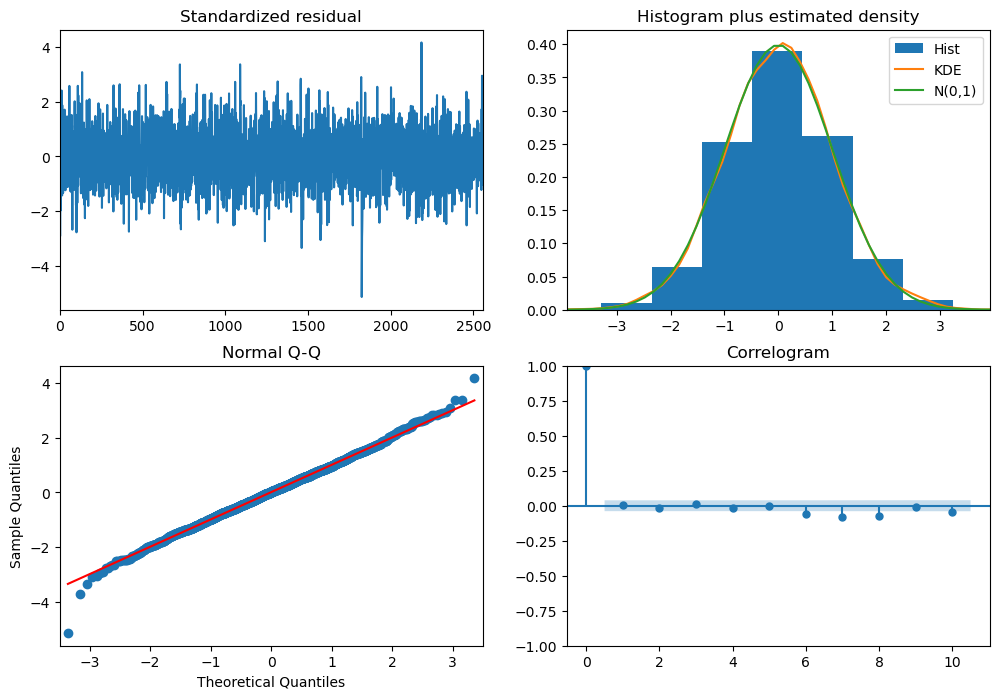

In [63]:
model.plot_diagnostics(figsize=(12, 8))
plt.show()

In [64]:
"""from pmdarima import auto_arima

# Fit auto_arima to find the best ARIMA model
model2 = auto_arima(np.log1p(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kerneler")]['num_sold']),
                   X = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kerneler")][fourier_features_year],
                   maxiter = 200,
                   start_p=1, start_q=1,      # Initial guesses for p and q
                   max_p=7, max_q=7,          # Upper bounds for p and q
                   m=7,                      # Seasonal period (e.g., 12 for monthly data)
                   start_P=0, start_Q = 0,
                   seasonal=True,  # For seasonal ARIMA
                   d=None,                    # Automatically determine order of differencing
                   D=None,                    # Automatically determine seasonal differencing
                   max_order = None,
                   trace=True,                # Print model selection progress
                   error_action='ignore',     # Ignore errors and continue
                   suppress_warnings=True,    # Suppress warnings
                   stepwise=True)             # Use stepwise search to reduce computation

# Print the summary of the best model
print(model.summary())"""

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[7] intercept   : AIC=-4676.797, Time=21.95 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=-3660.875, Time=1.73 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=-5286.747, Time=14.60 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=-5020.224, Time=31.65 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=-3662.874, Time=1.58 sec
 ARIMA(1,1,0)(0,0,0)[7] intercept   : AIC=-3906.832, Time=7.80 sec
 ARIMA(1,1,0)(2,0,0)[7] intercept   : AIC=-5812.673, Time=51.89 sec
 ARIMA(1,1,0)(2,0,1)[7] intercept   : AIC=inf, Time=69.09 sec
 ARIMA(1,1,0)(1,0,1)[7] intercept   : AIC=inf, Time=29.42 sec
 ARIMA(0,1,0)(2,0,0)[7] intercept   : AIC=-5205.969, Time=47.58 sec
 ARIMA(2,1,0)(2,0,0)[7] intercept   : AIC=-5953.313, Time=123.22 sec
 ARIMA(2,1,0)(1,0,0)[7] intercept   : AIC=-5410.605, Time=29.40 sec
 ARIMA(2,1,0)(2,0,1)[7] intercept   : AIC=inf, Time=142.07 sec
 ARIMA(2,1,0)(1,0,1)[7] intercept   : AIC=inf, Time=43.59 sec
 ARIMA(3,1,0)(2,0,0)[7] interc

In [67]:
"""from pmdarima import auto_arima
gdp_fourier_features_biyear = fourier_features_biyear + ["gdp"]
# Fit auto_arima to find the best ARIMA model
model3 = auto_arima(np.log1p(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kaggle")]['num_sold']),
                   X = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kaggle")][gdp_fourier_features_biyear],
                   maxiter = 200,
                   start_p=1, start_q=1,      # Initial guesses for p and q
                   max_p=7, max_q=7,          # Upper bounds for p and q
                   m=7,                      # Seasonal period (e.g., 12 for monthly data)
                   start_P=0, start_Q = 0,
                   seasonal=True,  # For seasonal ARIMA
                   d=None,                    # Automatically determine order of differencing
                   D=None,                    # Automatically determine seasonal differencing
                   max_order = None,
                   trace=True,                # Print model selection progress
                   error_action='ignore',     # Ignore errors and continue
                   suppress_warnings=True,    # Suppress warnings
                   stepwise=True)             # Use stepwise search to reduce computation

# Print the summary of the best model
print(model.summary())"""

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[7] intercept   : AIC=-3823.748, Time=3.21 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=6364.158, Time=3.28 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=inf, Time=2.98 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=4215.668, Time=7.38 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=23962.068, Time=1.39 sec
 ARIMA(1,0,1)(1,0,0)[7] intercept   : AIC=-4711.908, Time=5.69 sec
 ARIMA(1,0,1)(2,0,0)[7] intercept   : AIC=-4909.711, Time=5.36 sec
 ARIMA(1,0,1)(2,0,1)[7] intercept   : AIC=-5020.617, Time=7.44 sec
 ARIMA(1,0,1)(1,0,1)[7] intercept   : AIC=-5031.319, Time=3.58 sec
 ARIMA(1,0,1)(0,0,1)[7] intercept   : AIC=-4320.570, Time=2.71 sec
 ARIMA(1,0,1)(1,0,2)[7] intercept   : AIC=-5079.371, Time=6.53 sec
 ARIMA(1,0,1)(0,0,2)[7] intercept   : AIC=-4564.980, Time=9.05 sec
 ARIMA(1,0,1)(2,0,2)[7] intercept   : AIC=-5073.867, Time=5.79 sec
 ARIMA(0,0,1)(1,0,2)[7] intercept   : AIC=3960.791, Time=6.26 sec
 ARIMA(1,0,0)(1,0,2)[7] inte

In [68]:
from pmdarima import auto_arima
gdp_fourier_features_year = fourier_features_year + ["gdp"]

# Fit auto_arima to find the best ARIMA model
model4 = auto_arima(np.log1p(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kerneler")]['num_sold']),
                   X = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kerneler")][gdp_fourier_features_year],
                   maxiter = 200,
                   start_p=1, start_q=1,      # Initial guesses for p and q
                   max_p=7, max_q=7,          # Upper bounds for p and q
                   m=7,                      # Seasonal period (e.g., 12 for monthly data)
                   start_P=0, start_Q = 0,
                   seasonal=True,  # For seasonal ARIMA
                   d=None,                    # Automatically determine order of differencing
                   D=None,                    # Automatically determine seasonal differencing
                   max_order = None,
                   trace=True,                # Print model selection progress
                   error_action='ignore',     # Ignore errors and continue
                   suppress_warnings=True,    # Suppress warnings
                   stepwise=True)             # Use stepwise search to reduce computation

# Print the summary of the best model
print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[7] intercept   : AIC=-4788.416, Time=2.32 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=-4563.307, Time=1.70 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=-5631.174, Time=3.39 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=-5187.213, Time=3.88 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=12942.424, Time=1.59 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=-4783.498, Time=1.80 sec
 ARIMA(1,0,0)(2,0,0)[7] intercept   : AIC=-5877.649, Time=7.45 sec
 ARIMA(1,0,0)(2,0,1)[7] intercept   : AIC=-6024.865, Time=7.64 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=-6018.692, Time=3.60 sec
 ARIMA(1,0,0)(2,0,2)[7] intercept   : AIC=-6155.374, Time=7.92 sec
 ARIMA(1,0,0)(1,0,2)[7] intercept   : AIC=-5863.086, Time=7.67 sec
 ARIMA(0,0,0)(2,0,2)[7] intercept   : AIC=-5911.210, Time=18.58 sec
 ARIMA(2,0,0)(2,0,2)[7] intercept   : AIC=-6119.619, Time=7.32 sec
 ARIMA(1,0,1)(2,0,2)[7] intercept   : AIC=-6144.239, Time=7.29 sec
 ARIMA(0,0,1)(2,0,

C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1901: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\pmdarima\arima\_auto_solvers.py:38: RuntimeWarning: invalid value encountered in divide
  max_invroot = max(0, *np.abs(1 / model.arroots()))
C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1908: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\pmdarima\arima\_auto_solvers.py:40: RuntimeWarning: invalid value encountered in divide
  max_invroot = max(0, *np.abs(1 / model.maroots()))


 ARIMA(2,0,1)(2,0,2)[7] intercept   : AIC=-6076.355, Time=7.81 sec
 ARIMA(1,0,0)(2,0,2)[7]             : AIC=-6157.402, Time=7.61 sec
 ARIMA(1,0,0)(1,0,2)[7]             : AIC=-5865.127, Time=7.28 sec
 ARIMA(1,0,0)(2,0,1)[7]             : AIC=-6026.883, Time=7.45 sec
 ARIMA(1,0,0)(1,0,1)[7]             : AIC=-6020.722, Time=3.33 sec
 ARIMA(0,0,0)(2,0,2)[7]             : AIC=-6488.966, Time=16.75 sec
 ARIMA(0,0,0)(1,0,2)[7]             : AIC=-5928.629, Time=7.01 sec
 ARIMA(0,0,0)(2,0,1)[7]             : AIC=-6199.056, Time=6.12 sec
 ARIMA(0,0,0)(1,0,1)[7]             : AIC=-6194.189, Time=3.21 sec
 ARIMA(0,0,1)(2,0,2)[7]             : AIC=-6114.036, Time=17.55 sec
 ARIMA(1,0,1)(2,0,2)[7]             : AIC=-6146.453, Time=17.00 sec

Best model:  ARIMA(0,0,0)(2,0,2)[7]          
Total fit time: 190.301 seconds
                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:             

C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


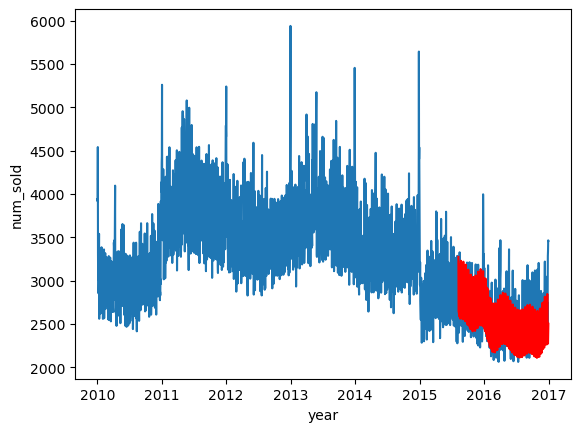

7.025855148243851


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['Seasonal_order']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['Seasonal_order']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


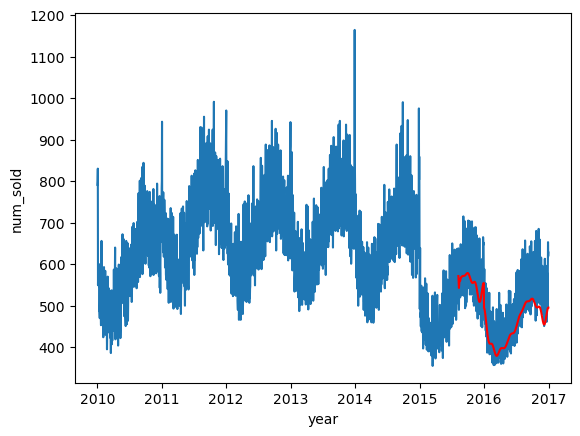

7.942892527162754


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


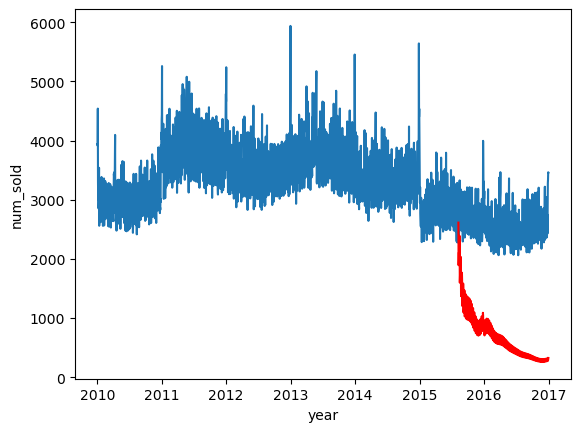

74.0537541468317


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


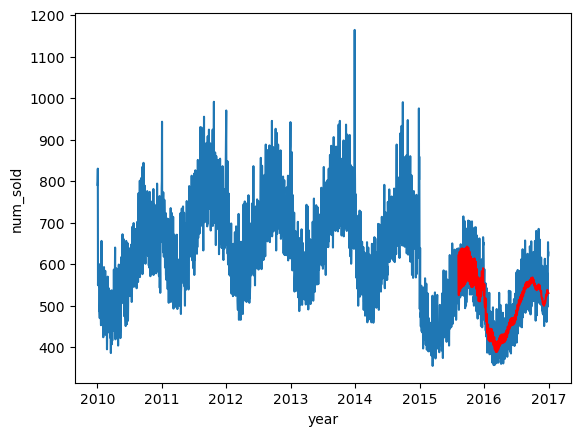

6.415816456535928


In [19]:
gdp_fourier_features_year = fourier_features_year + ["gdp"]
gdp_fourier_features_biyear = fourier_features_biyear + ["gdp"]
train = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model1 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[fourier_features_biyear],
                 order = (5,1,1), seasonal_order = (2,0,2,7)).fit(maxiter=200)
forecasts1 = np.expm1(model1.forecast(len(test), exog = test[fourier_features_biyear]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts1, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts1) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts1) / test['num_sold'])) * 100)



train = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model2 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[fourier_features_year],
                 order = (4,1,1), Seasonal_order = (1,0,2,7)).fit(maxiter=200)
forecasts2 = np.expm1(model2.forecast(len(test), exog = test[fourier_features_year]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts2, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts2) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts2) / test['num_sold'])) * 100)



train = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model3 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[gdp_fourier_features_biyear],
                 order = (6,0,3), seasonal_order = (2,0,2,7)).fit(maxiter=200)
forecasts3 = np.expm1(model3.forecast(len(test), exog = test[gdp_fourier_features_biyear]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts3, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts3) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts3) / test['num_sold'])) * 100)



train = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model4 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[gdp_fourier_features_year],
                 order = (0,0,0), seasonal_order = (2,0,2,7)).fit(maxiter=200)
forecasts4 = np.expm1(model4.forecast(len(test), exog = test[gdp_fourier_features_year]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts4, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts4) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts4) / test['num_sold'])) * 100)


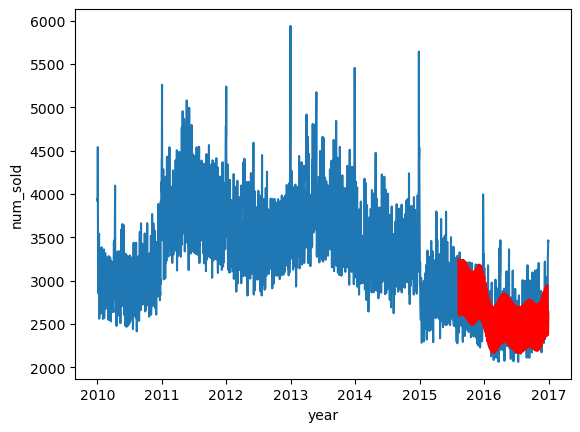

6.16806288229566


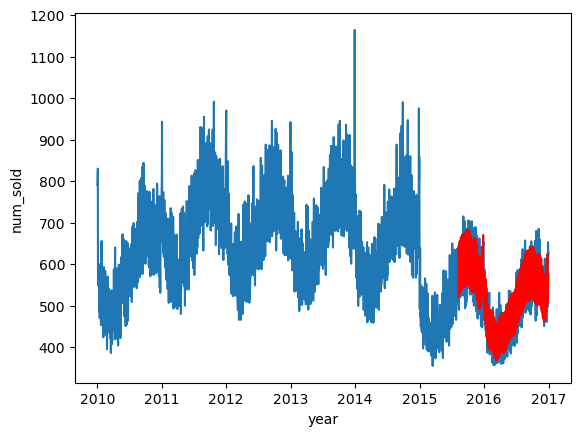

4.46788596220178


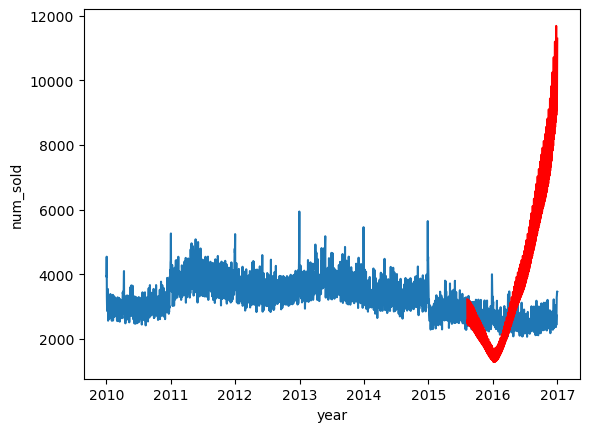

74.44760403591198


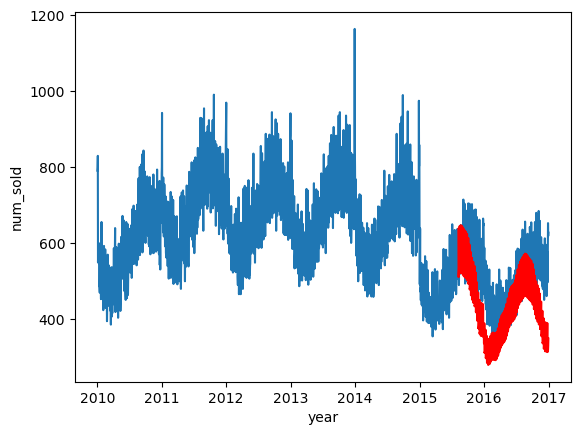

17.182949301884985


In [22]:
gdp_fourier_features_year = fourier_features_year + ["gdp"]
gdp_fourier_features_biyear = fourier_features_biyear + ["gdp"]
train = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model5 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[fourier_features_biyear],
                 order = (1,1,1), seasonal_order = (1,1,1,7)).fit(maxiter=200)
forecasts1 = np.expm1(model5.forecast(len(test), exog = test[fourier_features_biyear]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts1, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts1) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts1) / test['num_sold'])) * 100)



train = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model6 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[fourier_features_year],
                 order = (1,1,1), seasonal_order = (1,1,1,7)).fit(maxiter=200)
forecasts2 = np.expm1(model6.forecast(len(test), exog = test[fourier_features_year]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts2, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts2) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts2) / test['num_sold'])) * 100)



train = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model7 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[gdp_fourier_features_biyear],
                 order = (1,1,1), seasonal_order = (1,1,1,7)).fit(maxiter=200)
forecasts3 = np.expm1(model7.forecast(len(test), exog = test[gdp_fourier_features_biyear]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts3, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts3) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts3) / test['num_sold'])) * 100)



train = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model8 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[gdp_fourier_features_year],
                 order = (1,1,1), seasonal_order = (1,1,1,7)).fit(maxiter=200)
forecasts4 = np.expm1(model8.forecast(len(test), exog = test[gdp_fourier_features_year]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts4, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts4) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts4) / test['num_sold'])) * 100)


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


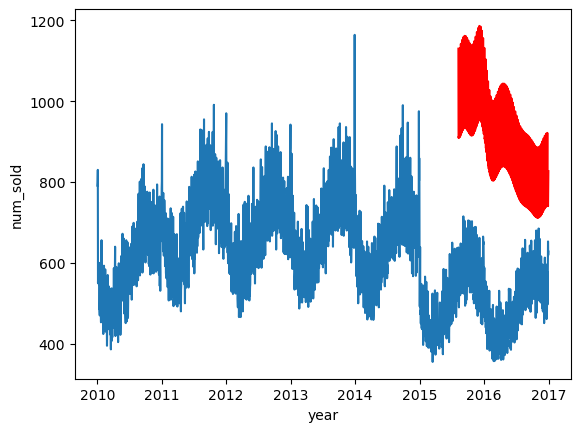

5.929806371823128


In [16]:
train = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kaggle Tiers")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kaggle Tiers")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kaggle Tiers")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kaggle Tiers")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model6 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[fourier_features_biyear],
                 order = (1,1,1), seasonal_order = (1,1,1,7)).fit(maxiter=200)
forecasts2 = np.expm1(model6.forecast(len(test), exog = test[fourier_features_biyear]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kaggle Tiers")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts2, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts2) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts2) / test['num_sold'])) * 100)

C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


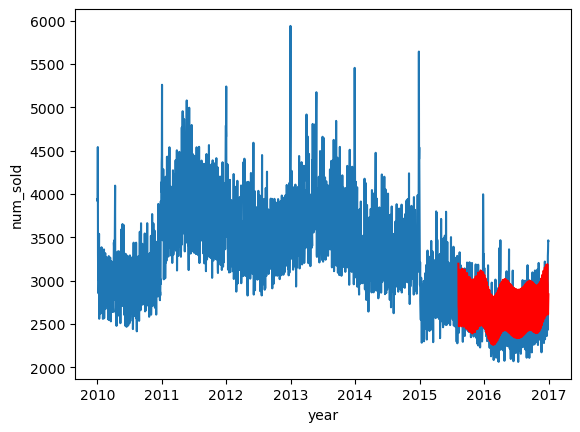

7.514815897553641


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


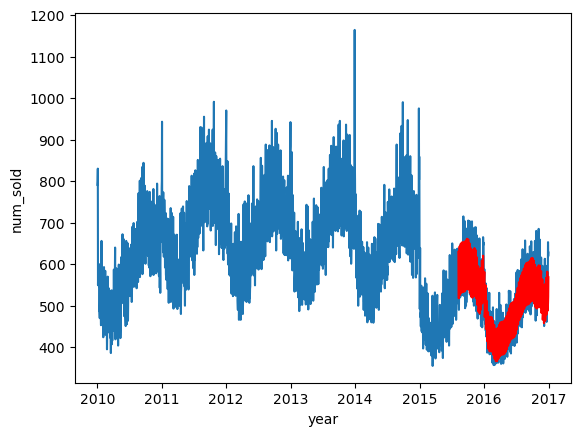

4.92769601613458


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


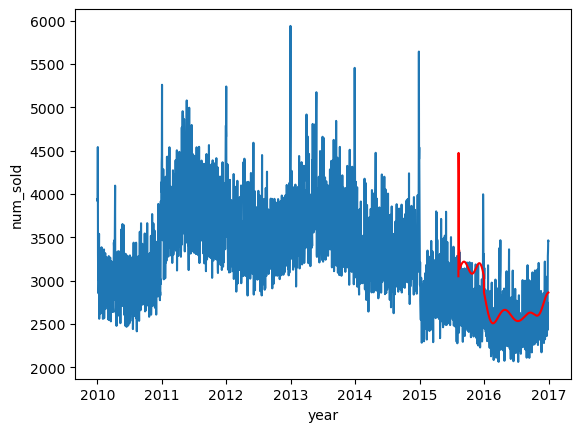

12.586474387877658


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


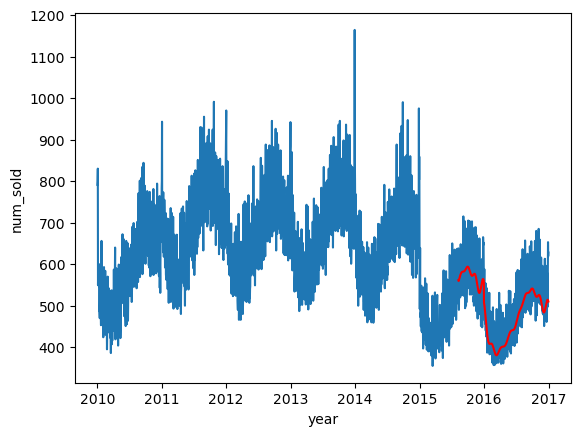

7.551069544746284


In [23]:
gdp_fourier_features_year = fourier_features_year + ["gdp"]
gdp_fourier_features_biyear = fourier_features_biyear + ["gdp"]
train = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model9 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[fourier_features_biyear],
                 order = (7,1,7)).fit(maxiter=200)
forecasts1 = np.expm1(model9.forecast(len(test), exog = test[fourier_features_biyear]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts1, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts1) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts1) / test['num_sold'])) * 100)



train = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model10 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[fourier_features_year],
                 order = (7,1,7)).fit(maxiter=200)
forecasts2 = np.expm1(model10.forecast(len(test), exog = test[fourier_features_year]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts2, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts2) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts2) / test['num_sold'])) * 100)



train = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model11 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[gdp_fourier_features_biyear],
                 order = (7,1,7)).fit(maxiter=200)
forecasts3 = np.expm1(model11.forecast(len(test), exog = test[gdp_fourier_features_biyear]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts3, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts3) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts3) / test['num_sold'])) * 100)



train = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
model12 = SARIMAX(np.log1p(train['num_sold']),
                 exog = train[gdp_fourier_features_year],
                 order = (1,1,1)).fit(maxiter=200)
forecasts4 = np.expm1(model12.forecast(len(test), exog = test[gdp_fourier_features_year]))
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Discount Stickers") & (df["product"] == "Kerneler")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts4, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
np.mean(np.abs((test['num_sold'] - forecasts4) / test['num_sold'])) * 100
print(np.mean(np.abs((test['num_sold'] - forecasts4) / test['num_sold'])) * 100)


In [6]:
"""
sarimax_models = {
    i: {
        j: {
            k: 1
            for k in df["product"].unique()
        }
        for j in df["store"].unique()
    }
    for i in df["country"].unique()
}
for i in df["country"].unique():
    for j in df["store"].unique():
        for k in df["product"].unique():
            train = df.loc[(df["country"] == i) & (df["store"] == j) & (df["product"] == k)]
            train = train.set_index('date').asfreq('D')
            print(i + " " + j + " " + k)
            if (k == "Kaggle") or (k == "Kaggle Tiers"):
                sarimax_models[i][j][k] = SARIMAX(
                    np.log1p(train['num_sold']),
                    order=(1, 1, 1), seasonal_order=(1,1,1,7),
                    exog = train[fourier_features_biyear]).fit(maxiter=300)
            else:
                sarimax_models[i][j][k] = SARIMAX(
                    np.log1p(train['num_sold']),
                    order=(1, 1, 1), seasonal_order=(1,1,1,7),
                    exog = train[fourier_features_year]).fit(maxiter=300)
                    """

Canada Discount Stickers Holographic Goose
Canada Discount Stickers Kaggle
Canada Discount Stickers Kaggle Tiers
Canada Discount Stickers Kerneler
Canada Discount Stickers Kerneler Dark Mode
Canada Stickers for Less Holographic Goose
Canada Stickers for Less Kaggle
Canada Stickers for Less Kaggle Tiers
Canada Stickers for Less Kerneler
Canada Stickers for Less Kerneler Dark Mode
Canada Premium Sticker Mart Holographic Goose
Canada Premium Sticker Mart Kaggle
Canada Premium Sticker Mart Kaggle Tiers


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Canada Premium Sticker Mart Kerneler
Canada Premium Sticker Mart Kerneler Dark Mode
Finland Discount Stickers Holographic Goose
Finland Discount Stickers Kaggle
Finland Discount Stickers Kaggle Tiers
Finland Discount Stickers Kerneler
Finland Discount Stickers Kerneler Dark Mode
Finland Stickers for Less Holographic Goose
Finland Stickers for Less Kaggle
Finland Stickers for Less Kaggle Tiers
Finland Stickers for Less Kerneler
Finland Stickers for Less Kerneler Dark Mode
Finland Premium Sticker Mart Holographic Goose
Finland Premium Sticker Mart Kaggle


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Finland Premium Sticker Mart Kaggle Tiers


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Finland Premium Sticker Mart Kerneler
Finland Premium Sticker Mart Kerneler Dark Mode
Italy Discount Stickers Holographic Goose
Italy Discount Stickers Kaggle
Italy Discount Stickers Kaggle Tiers
Italy Discount Stickers Kerneler
Italy Discount Stickers Kerneler Dark Mode
Italy Stickers for Less Holographic Goose
Italy Stickers for Less Kaggle
Italy Stickers for Less Kaggle Tiers
Italy Stickers for Less Kerneler
Italy Stickers for Less Kerneler Dark Mode
Italy Premium Sticker Mart Holographic Goose
Italy Premium Sticker Mart Kaggle
Italy Premium Sticker Mart Kaggle Tiers


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Italy Premium Sticker Mart Kerneler
Italy Premium Sticker Mart Kerneler Dark Mode


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Kenya Discount Stickers Holographic Goose
Kenya Discount Stickers Kaggle
Kenya Discount Stickers Kaggle Tiers
Kenya Discount Stickers Kerneler
Kenya Discount Stickers Kerneler Dark Mode
Kenya Stickers for Less Holographic Goose
Kenya Stickers for Less Kaggle
Kenya Stickers for Less Kaggle Tiers
Kenya Stickers for Less Kerneler
Kenya Stickers for Less Kerneler Dark Mode
Kenya Premium Sticker Mart Holographic Goose
Kenya Premium Sticker Mart Kaggle


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Kenya Premium Sticker Mart Kaggle Tiers
Kenya Premium Sticker Mart Kerneler
Kenya Premium Sticker Mart Kerneler Dark Mode
Norway Discount Stickers Holographic Goose
Norway Discount Stickers Kaggle
Norway Discount Stickers Kaggle Tiers
Norway Discount Stickers Kerneler
Norway Discount Stickers Kerneler Dark Mode
Norway Stickers for Less Holographic Goose
Norway Stickers for Less Kaggle
Norway Stickers for Less Kaggle Tiers
Norway Stickers for Less Kerneler
Norway Stickers for Less Kerneler Dark Mode
Norway Premium Sticker Mart Holographic Goose
Norway Premium Sticker Mart Kaggle
Norway Premium Sticker Mart Kaggle Tiers


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Norway Premium Sticker Mart Kerneler
Norway Premium Sticker Mart Kerneler Dark Mode
Singapore Discount Stickers Holographic Goose
Singapore Discount Stickers Kaggle
Singapore Discount Stickers Kaggle Tiers
Singapore Discount Stickers Kerneler
Singapore Discount Stickers Kerneler Dark Mode
Singapore Stickers for Less Holographic Goose
Singapore Stickers for Less Kaggle
Singapore Stickers for Less Kaggle Tiers


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Singapore Stickers for Less Kerneler
Singapore Stickers for Less Kerneler Dark Mode
Singapore Premium Sticker Mart Holographic Goose
Singapore Premium Sticker Mart Kaggle
Singapore Premium Sticker Mart Kaggle Tiers


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Singapore Premium Sticker Mart Kerneler
Singapore Premium Sticker Mart Kerneler Dark Mode


In [7]:
"""for i in df["country"].unique():
    for j in df["store"].unique():
        for k in df["product"].unique():
            print(i + " " + j + " " + k)
            sarimax_models[i][j][k].save(f"sarimax_models2/{i}_{j}_{k}.pkl")"""

Canada Discount Stickers Holographic Goose
Canada Discount Stickers Kaggle
Canada Discount Stickers Kaggle Tiers
Canada Discount Stickers Kerneler
Canada Discount Stickers Kerneler Dark Mode
Canada Stickers for Less Holographic Goose
Canada Stickers for Less Kaggle
Canada Stickers for Less Kaggle Tiers
Canada Stickers for Less Kerneler
Canada Stickers for Less Kerneler Dark Mode
Canada Premium Sticker Mart Holographic Goose
Canada Premium Sticker Mart Kaggle
Canada Premium Sticker Mart Kaggle Tiers
Canada Premium Sticker Mart Kerneler
Canada Premium Sticker Mart Kerneler Dark Mode
Finland Discount Stickers Holographic Goose
Finland Discount Stickers Kaggle
Finland Discount Stickers Kaggle Tiers
Finland Discount Stickers Kerneler
Finland Discount Stickers Kerneler Dark Mode
Finland Stickers for Less Holographic Goose
Finland Stickers for Less Kaggle
Finland Stickers for Less Kaggle Tiers
Finland Stickers for Less Kerneler
Finland Stickers for Less Kerneler Dark Mode
Finland Premium Stic

In [10]:
import statsmodels.api as sm
sarimax_models = {
    i: {
        j: {
            k: 1
            for k in df["product"].unique()
        }
        for j in df["store"].unique()
    }
    for i in df["country"].unique()
}
for i in df["country"].unique():
    for j in df["store"].unique():
        for k in df["product"].unique():
            print(i + " " + j + " " + k)
            sarimax_models[i][j][k] = sm.load(f"sarimax_models/{i}_{j}_{k}.pkl")

Canada Discount Stickers Holographic Goose
Canada Discount Stickers Kaggle
Canada Discount Stickers Kaggle Tiers
Canada Discount Stickers Kerneler
Canada Discount Stickers Kerneler Dark Mode
Canada Stickers for Less Holographic Goose
Canada Stickers for Less Kaggle
Canada Stickers for Less Kaggle Tiers
Canada Stickers for Less Kerneler
Canada Stickers for Less Kerneler Dark Mode
Canada Premium Sticker Mart Holographic Goose
Canada Premium Sticker Mart Kaggle
Canada Premium Sticker Mart Kaggle Tiers
Canada Premium Sticker Mart Kerneler
Canada Premium Sticker Mart Kerneler Dark Mode
Finland Discount Stickers Holographic Goose
Finland Discount Stickers Kaggle
Finland Discount Stickers Kaggle Tiers
Finland Discount Stickers Kerneler
Finland Discount Stickers Kerneler Dark Mode
Finland Stickers for Less Holographic Goose
Finland Stickers for Less Kaggle
Finland Stickers for Less Kaggle Tiers
Finland Stickers for Less Kerneler
Finland Stickers for Less Kerneler Dark Mode
Finland Premium Stic

In [53]:

train = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[:-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2)]
test = df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")].iloc[-int(len(df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")]) * 0.2):]
train = train.set_index('date')
test = test.set_index('date')
train = train.asfreq('D')
test = test.asfreq('D')
experiment_model = SARIMAX(np.log1p(train['num_sold']) , exog = train[fourier_features_biyear],
                    order=(7, 1, 7), #seasonal_order = (1,1,1,7)
                   ).fit(maxiter=200)
boxcox_forecasts = experiment_model.forecast(len(test), exog = test[fourier_features_biyear])
forecasts = np.expm1(boxcox_forecasts)


C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\anaconda3\envs\dataset_pytorch_based\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


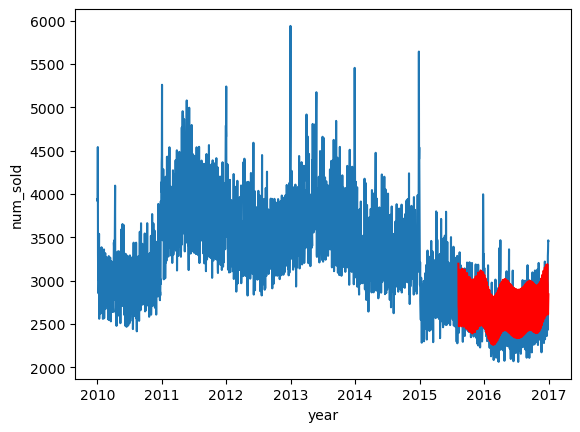

Series([], Freq: D, dtype: float64)

In [54]:
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
experiment_model.fittedvalues[experiment_model.fittedvalues == np.exp(experiment_model.fittedvalues).max()]

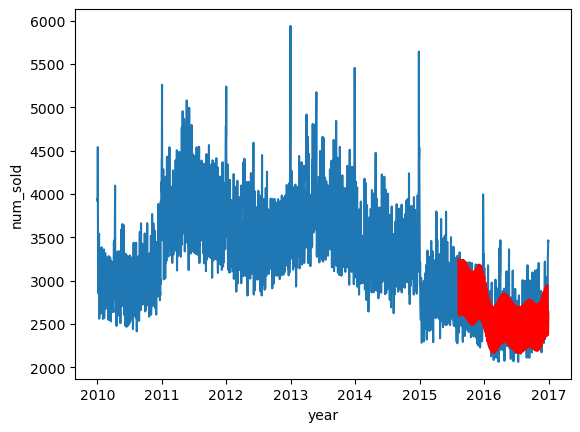

Series([], Freq: D, dtype: float64)

In [51]:
sns.lineplot(data=df.loc[(df["country"] == "Norway") & (df["store"] == "Premium Sticker Mart") & (df["product"] == "Kaggle")], x='date', y=df['num_sold'])
sns.lineplot(x=test.index, y = forecasts, color="red")
plt.xlabel('year')                   # X-axis label
plt.ylabel('num_sold')    
plt.show()
experiment_model.fittedvalues[experiment_model.fittedvalues == np.exp(experiment_model.fittedvalues).max()]

In [8]:
dfTest = pd.read_csv("test.csv")
dfTest["date"] = pd.to_datetime(dfTest["date"])
dfTest.head()


,id,date,country,store,product
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode


In [9]:
dfTest["day_of_year"] = dfTest["date"].dt.dayofyear
dfTest["year"] = dfTest["date"].dt.year
dfTest["day_of_biyear"] = (dfTest["year"] % 2) * 365 + dfTest["day_of_year"] 
for i in range(1, 10):
    dfTest[f"biyear_fourier_sin_order_{i}"] = np.sin(2*np.pi*i*dfTest['day_of_biyear']/730)
    dfTest[f"biyear_fourier_cos_order_{i}"] = np.cos(2*np.pi*i*dfTest['day_of_biyear']/730)
    dfTest[f"year_fourier_sin_order_{i}"] = np.sin(2 * np.pi * i * dfTest["day_of_year"] /365)
    dfTest[f"year_fourier_cos_order_{i}"] = np.cos(2*np.pi*i*dfTest["day_of_year"]/ 365)
fourier_features_biyear = [i for i in list(dfTest) if i.startswith('biyear')]
fourier_features_year = [i for i in list(dfTest) if i.startswith('year')]

In [10]:
all_forecasts = []
for i in dfTest["country"].unique():
    for j in dfTest["store"].unique():
        for k in dfTest["product"].unique():
            test = dfTest.loc[(dfTest["country"] == i) & (dfTest["store"] == j) & (dfTest["product"] == k)]
            if (k == "Kaggle") or (k == "Kaggle Tiers"):
                predicted = sarimax_models[i][j][k].forecast(len(test), exog = test[fourier_features_biyear])
            else:
                predicted = sarimax_models[i][j][k].forecast(len(test), exog = test[fourier_features_year])

            merger = pd.DataFrame({
                'date': predicted.index,
                'country': i,
                'store': j,
                'product': k,
                'forecasting': predicted.values
            })
            all_forecasts.append(merger)
forecast_df = pd.concat(all_forecasts)
dfTest = pd.merge(dfTest, forecast_df, on= [ "date", "country", "store", 'product'], how="left")
dfTest.head()

,id,date,country,store,product,day_of_year,year,day_of_biyear,biyear_fourier_sin_order_1,biyear_fourier_cos_order_1,...,year_fourier_cos_order_7,biyear_fourier_sin_order_8,biyear_fourier_cos_order_8,year_fourier_sin_order_8,year_fourier_cos_order_8,biyear_fourier_sin_order_9,biyear_fourier_cos_order_9,year_fourier_sin_order_9,year_fourier_cos_order_9,forecasting
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,4.787377
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,6.775662
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,6.541256
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,5.895451
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,6.058098


In [160]:
for i in forecast_df.columns:
    if (i == "id") or (i == "num_sold"):
        continue
    print(i + " Unique Values: " + str(forecast_df[i].nunique()))

date Unique Values: 1095
country Unique Values: 6
store Unique Values: 3
product Unique Values: 5
forecasting Unique Values: 98550


In [14]:
dfTest = dfTest.rename(columns={"forecasting": "num_sold"})
dfTest["num_sold"] = np.expm1(dfTest["num_sold"])
dfTest.head()

,id,date,country,store,product,day_of_year,year,day_of_biyear,biyear_fourier_sin_order_1,biyear_fourier_cos_order_1,...,year_fourier_cos_order_7,biyear_fourier_sin_order_8,biyear_fourier_cos_order_8,year_fourier_sin_order_8,year_fourier_cos_order_8,biyear_fourier_sin_order_9,biyear_fourier_cos_order_9,year_fourier_sin_order_9,year_fourier_cos_order_9,num_sold
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,118.986277
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,875.258983
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,692.156947
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,362.380526
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,426.561571


In [16]:
y_test_pred = dfTest[["id", 'num_sold']].copy()
y_test_pred["num_sold"] = np.round(y_test_pred["num_sold"])
y_test_pred.to_csv("submission6.csv", index = False)


In [189]:
dfTest.head()

,id,date,country,store,product,day_of_year,year,day_of_biyear,biyear_fourier_sin_order_1,biyear_fourier_cos_order_1,...,year_fourier_cos_order_7,biyear_fourier_sin_order_8,biyear_fourier_cos_order_8,year_fourier_sin_order_8,year_fourier_cos_order_8,biyear_fourier_sin_order_9,biyear_fourier_cos_order_9,year_fourier_sin_order_9,year_fourier_cos_order_9,num_sold
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,124.884244
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,867.882963
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,658.224089
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,359.869674
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,435.417046


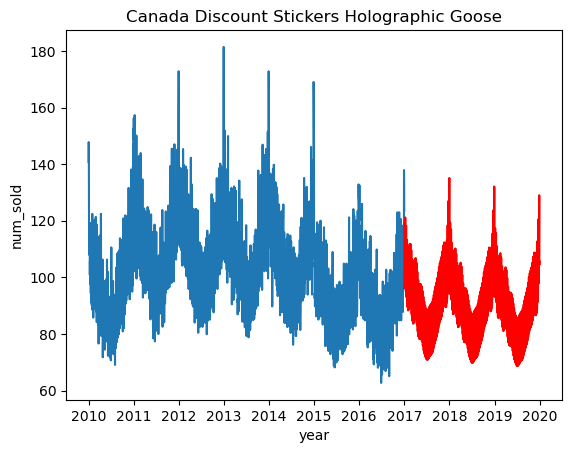

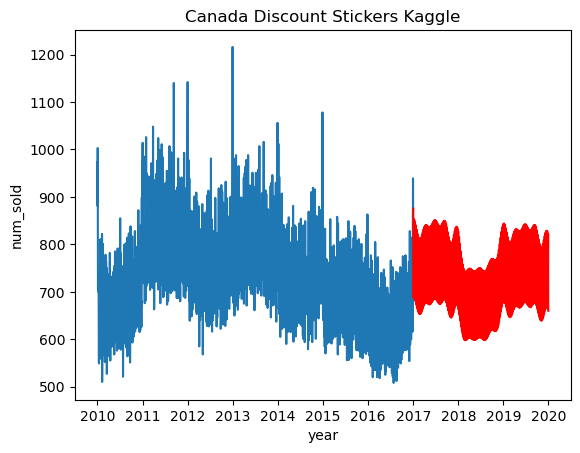

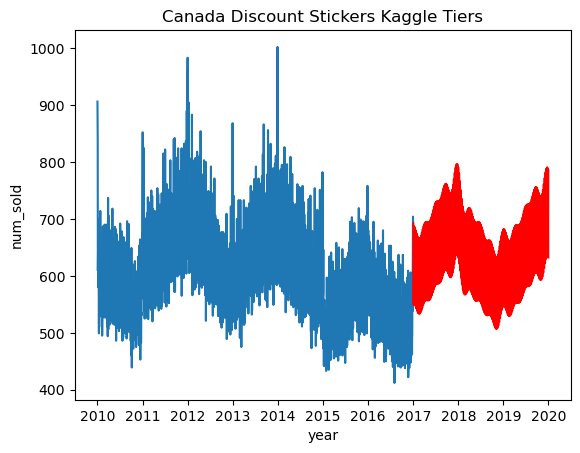

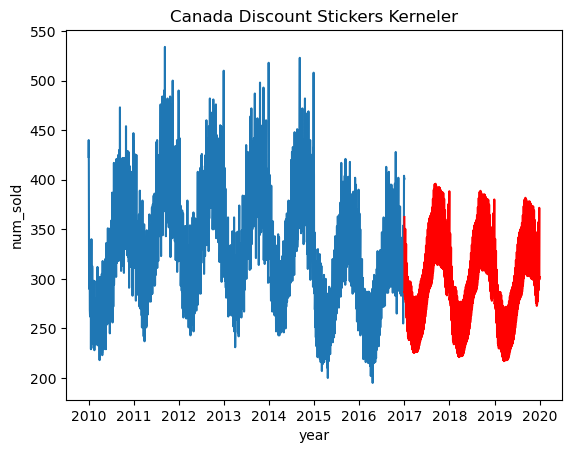

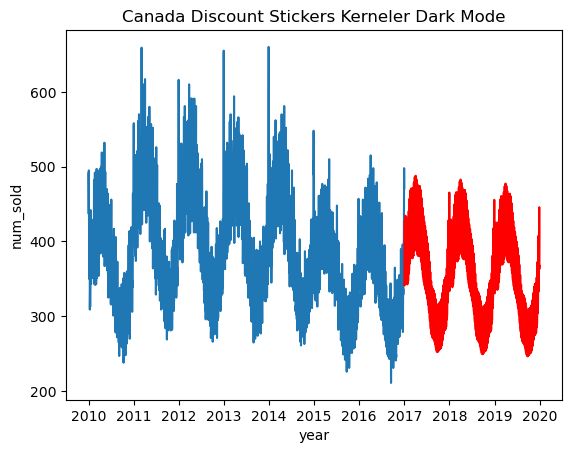

...

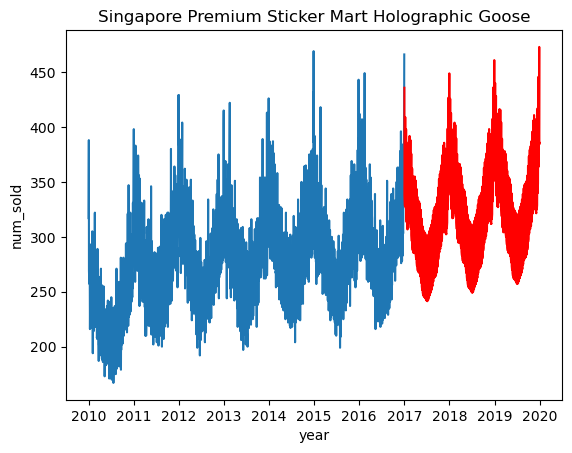

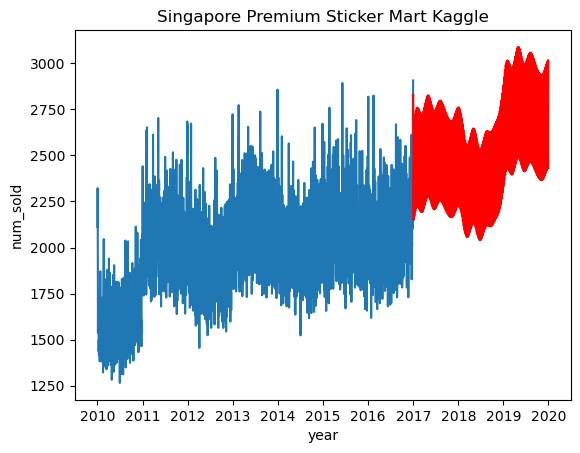

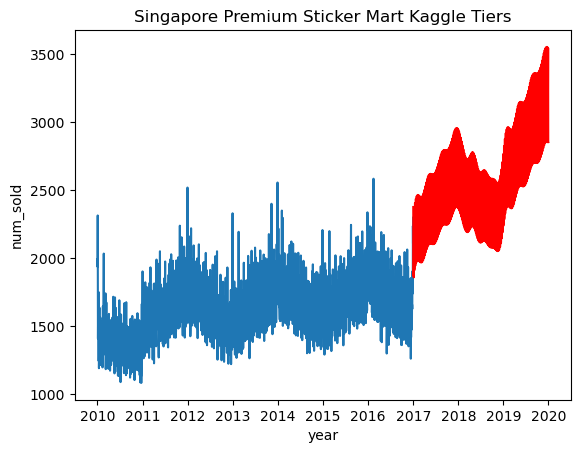

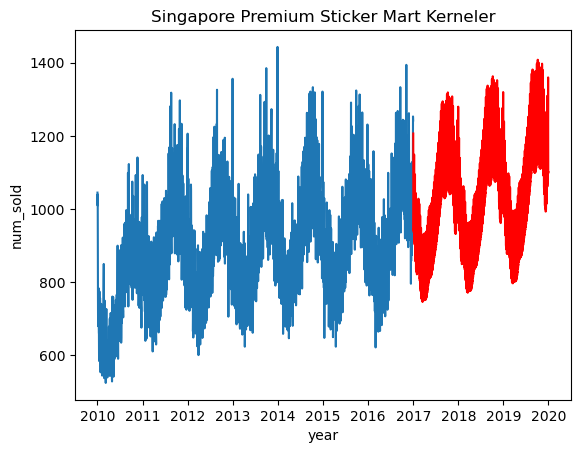

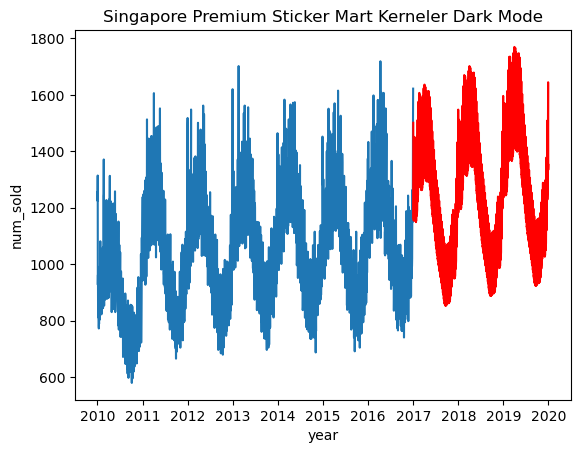

In [15]:
for i in dfTest["country"].unique():
    for j in dfTest["store"].unique():
        for k in dfTest["product"].unique():
            sns.lineplot(data=df.loc[(df["country"] == i) & (df["store"] == j) & (df["product"] == k)], x='date', y=df['num_sold'])
            sns.lineplot(data=dfTest.loc[(dfTest["country"] == i) & (dfTest["store"] == j) & (dfTest["product"] == k)], x='date', y=dfTest['num_sold'], color = "red")
            plt.xlabel('year')                   # X-axis label
            plt.ylabel('num_sold')
            plt.title(f"{i} {j} {k}")
            plt.show()

In [13]:
dfTest.head()

,id,date,country,store,product,day_of_year,year,day_of_biyear,biyear_fourier_sin_order_1,biyear_fourier_cos_order_1,...,year_fourier_cos_order_7,biyear_fourier_sin_order_8,biyear_fourier_cos_order_8,year_fourier_sin_order_8,year_fourier_cos_order_8,biyear_fourier_sin_order_9,biyear_fourier_cos_order_9,year_fourier_sin_order_9,year_fourier_cos_order_9,forecasting
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,4.787377
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,6.775662
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,6.541256
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,5.895451
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode,1,2017,366,-0.008607,-0.999963,...,0.992749,0.068802,0.99763,0.137279,0.990532,-0.077386,-0.997001,0.154309,0.988023,6.058098


To create my best model, what I did was take the code from https://www.kaggle.com/code/cabaxiom/s5e1-previous-years-baseline-no-model and then I combined it with the weight being 40% and 60% my Sarimax model.